In [3]:
import pandas
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import (Reshape,LeakyReLU,Dropout,Conv2DTranspose, Add, Conv2D, MaxPool2D, Dense,
                                     Flatten, InputLayer, BatchNormalization, Input, )
from tensorflow.keras.optimizers import Adam

In [ ]:
from google.colab import files
files.upload()
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d jessicali9530/celeba-dataset
!unzip "/content/celeba-dataset.zip" -d "/content/data/"

In [4]:
BATCH_SIZE = 128
IM_SHAPE = (64, 64, 3)
LEARNING_RATE = 2e-4
LATENT_DIM = 200
EPOCHS = 20

In [3]:
dataset = tf.keras.preprocessing.image_dataset_from_directory("/content/data/img_align_celeba/img_align_celeba",
                                                              label_mode=None,
                                                              image_size=(IM_SHAPE[0], IM_SHAPE[1]),
                                                              batch_size=BATCH_SIZE)
dataset

Found 202599 files belonging to 1 classes.


<_BatchDataset element_spec=TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None)>

In [4]:
def preprocess(image):
  return tf.cast(image, tf.float32) / 127.5 - 1.0

In [5]:
train_dataset = (dataset.map(preprocess)
                    .unbatch()
                    .shuffle(buffer_size = 1024, reshuffle_each_iteration = True)
                    .batch(BATCH_SIZE, drop_remainder = True)
                    .prefetch(tf.data.AUTOTUNE))

In [ ]:
for d in train_dataset.take(1):
  print(d.shape)

(128, 64, 64, 3)


In [ ]:
plt.figure(figsize = (6,6))
k = 0
n = 4
for i in range(n):
  ax = plt.subplot(2, 2, k+1)
  plt.imshow((d[i] + 1) / 2)
  plt.axis("off")
  k += 1

In [5]:
generator = tf.keras.Sequential([
    Input(shape=(LATENT_DIM,)),
    Dense(4*4*LATENT_DIM),
    Reshape((4,4,LATENT_DIM)),

    Conv2DTranspose(512,kernel_size=4,strides=2,padding='same'),
    BatchNormalization(),
    LeakyReLU(0.2),

    Conv2DTranspose(256,kernel_size=4,strides=2,padding='same'),
    BatchNormalization(),
    LeakyReLU(0.2),

    Conv2DTranspose(128,kernel_size=4,strides=2,padding='same'),
    BatchNormalization(),
    LeakyReLU(0.2),

    Conv2DTranspose(3,kernel_size=4,strides=2,activation=tf.keras.activations.tanh,padding='same'),
], name='generator')

In [7]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 3200)              643200    
                                                                 
 reshape (Reshape)           (None, 4, 4, 200)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 512)        1638912   
 nspose)                                                         
                                                                 
 batch_normalization (BatchN  (None, 8, 8, 512)        2048      
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 16, 16, 256)      20

In [6]:
discriminator = tf.keras.Sequential([
    Input(shape=(IM_SHAPE[0],IM_SHAPE[1],3)),

    Conv2D(64,kernel_size=4,strides=2,padding='same'),
    LeakyReLU(0.2),

    Conv2D(128,kernel_size=4,strides=2,padding='same'),
    BatchNormalization(),
    LeakyReLU(0.2),

    Conv2D(256,kernel_size=4,strides=2,padding='same'),
    BatchNormalization(),
    LeakyReLU(0.2),

    Conv2D(1,kernel_size=4,strides=2,padding='same'),

    Flatten(),
    Dense(1, activation='sigmoid'),
], name='discriminator')

In [10]:
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 batch_normalization_5 (Batc  (None, 16, 16, 128)      512       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 8, 8, 256)         524544    
                                                     

In [7]:
import os
from google.colab import drive

drive.mount('/content/drive')
#os.makedirs("/content/drive/MyDrive/gan/weights", exist_ok=True)
#os.makedirs("/content/drive/MyDrive/gan/images", exist_ok=True)

Mounted at /content/drive


In [19]:
class ShowImage(tf.keras.callbacks.Callback):
    def __init__(self, latent_dim=200):
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        n=5
        k=0
        out=self.model.generator(tf.random.normal(shape=(25, self.latent_dim)))
        plt.figure(figsize=(15,15))
        for i in range(n):
          for j in range(n):
            ax=plt.subplot(n,n,k+1)
            plt.imshow((out[k]+1)/2,)
            plt.axis('off')
            k+=1
        plt.savefig("/content/drive/MyDrive/gan/images/gen_images_epoch_{}.png".format(epoch+101))

        # Save weights
        self.model.generator.save_weights("/content/drive/MyDrive/gan/weights/generator_" + str(epoch + 100) + '.h5')
        self.model.discriminator.save_weights("/content/drive/MyDrive/gan/weights/discriminator_" + str(epoch + 100) + ".h5")
        self.model.save_weights("/content/drive/MyDrive/gan/weights/gan_" + str(epoch + 100) + ".h5")

In [8]:
class GAN(tf.keras.Model):
  def __init__(self, discriminator_model, generator_model):
    super(GAN, self).__init__()
    self.discriminator = discriminator_model
    self.generator = generator_model

  def compile(self, d_optimizer, g_optimizer, loss_func):
    super(GAN, self).compile()
    self.d_optimizer = d_optimizer
    self.g_optimizer = g_optimizer
    self.loss_func = loss_func
    self.d_loss_metric = tf.keras.metrics.Mean(name='d_loss')
    self.g_loss_metric = tf.keras.metrics.Mean(name='g_loss')

  def call(self, inputs, *args, **kwargs):
    return self.model(inputs)

  @property
  def metrics(self):
    return [self.d_loss_metric, self.d_loss_metric]

  def train_step(self, real_images):
    batch_size = tf.shape(real_images)[0]

    # Discriminator loss
    random_noise = tf.random.normal(shape=(batch_size,LATENT_DIM))
    fake_images = self.generator(random_noise)

    real_labels = tf.ones((batch_size, 1)) + 0.25*tf.random.uniform((batch_size, 1), minval=-1, maxval=1)
    fake_labels = tf.zeros((batch_size, 1)) + 0.25*tf.random.uniform((batch_size, 1),)

    with tf.GradientTape() as recorder:
      real_predictions = self.discriminator(real_images)
      d_loss_real = self.loss_func(real_labels, real_predictions)

      fake_predictions = self.discriminator(fake_images)
      d_loss_fake = self.loss_func(fake_labels, fake_predictions)

      d_loss = d_loss_real + d_loss_fake

    partial_drivatives = recorder.gradient(d_loss, self.discriminator.trainable_weights)
    self.d_optimizer.apply_gradients(zip(partial_drivatives, self.discriminator.trainable_weights))

    # Generator loss
    random_noise = tf.random.normal(shape=(batch_size,LATENT_DIM))
    flipped_fake_labels = tf.ones((batch_size, 1))

    with tf.GradientTape() as recorder:
      fake_predictions = self.discriminator(self.generator(random_noise))
      g_loss = self.loss_func(flipped_fake_labels, fake_predictions)

    partial_drivatives = recorder.gradient(g_loss, self.generator.trainable_weights)
    self.g_optimizer.apply_gradients(zip(partial_drivatives, self.generator.trainable_weights))

    self.d_loss_metric.update_state(d_loss)
    self.g_loss_metric.update_state(g_loss)

    return {'d_loss':self.d_loss_metric.result(), 'g_loss':self.g_loss_metric.result()}

First training

In [16]:
gan = GAN(discriminator, generator)
gan.compile(
    d_optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=0.5),
    g_optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=0.5),
    loss_func=tf.keras.losses.BinaryCrossentropy(),
)

If not first training

In [9]:
generator.load_weights('/content/drive/MyDrive/gan/generator_weights.h5')
discriminator.load_weights('/content/drive/MyDrive/gan/discriminator_weights.h5')

In [10]:
gan = GAN(discriminator, generator)
gan.built = True
gan.compile(
    d_optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=0.5),
    g_optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=0.5),
    loss_func=tf.keras.losses.BinaryCrossentropy(),
)
gan.load_weights('/content/drive/MyDrive/gan/gan_weights.h5')

Epoch 1/25
      6/Unknown - 2s 178ms/step - d_loss: 1.0486 - g_loss: 0.8617

1582/1582 [==============================] - 301s 189ms/step - d_loss: 1.1492 - g_loss: 0.8628
Epoch 2/25
1582/1582 [==============================] - 307s 194ms/step - d_loss: 1.1443 - g_loss: 0.8652
Epoch 3/25
1582/1582 [==============================] - 308s 195ms/step - d_loss: 1.1748 - g_loss: 0.8673
Epoch 4/25
1582/1582 [==============================] - 310s 195ms/step - d_loss: 1.1795 - g_loss: 0.8690
Epoch 5/25
1582/1582 [==============================] - 308s 194ms/step - d_loss: 1.1364 - g_loss: 0.8708
Epoch 6/25
1582/1582 [==============================] - 308s 195ms/step - d_loss: 1.1256 - g_loss: 0.8729
Epoch 7/25
1582/1582 [==============================] - 308s 194ms/step - d_loss: 1.1324 - g_loss: 0.8754
Epoch 8/25
1582/1582 [==============================] - 308s 194ms/step - d_loss: 1.1290 - g_loss: 0.8777
Epoch 9/25
1582/1582 [==============================] - 308s 194ms/step - d_loss: 1.1223 - g_loss: 0.8800
Epoch 10/25
1582/1582 [==============================] - 

<ipython-input-19-28313b6fb4b5>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15,15))


1582/1582 [==============================] - 307s 193ms/step - d_loss: 1.0860 - g_loss: 0.9100
Epoch 22/25
1582/1582 [==============================] - 308s 194ms/step - d_loss: 1.0742 - g_loss: 0.9129
Epoch 23/25
1582/1582 [==============================] - 308s 194ms/step - d_loss: 1.0523 - g_loss: 0.9156
Epoch 24/25
1582/1582 [==============================] - 309s 195ms/step - d_loss: 1.0622 - g_loss: 0.9183
Epoch 25/25
1582/1582 [==============================] - 308s 194ms/step - d_loss: 1.0397 - g_loss: 0.9212


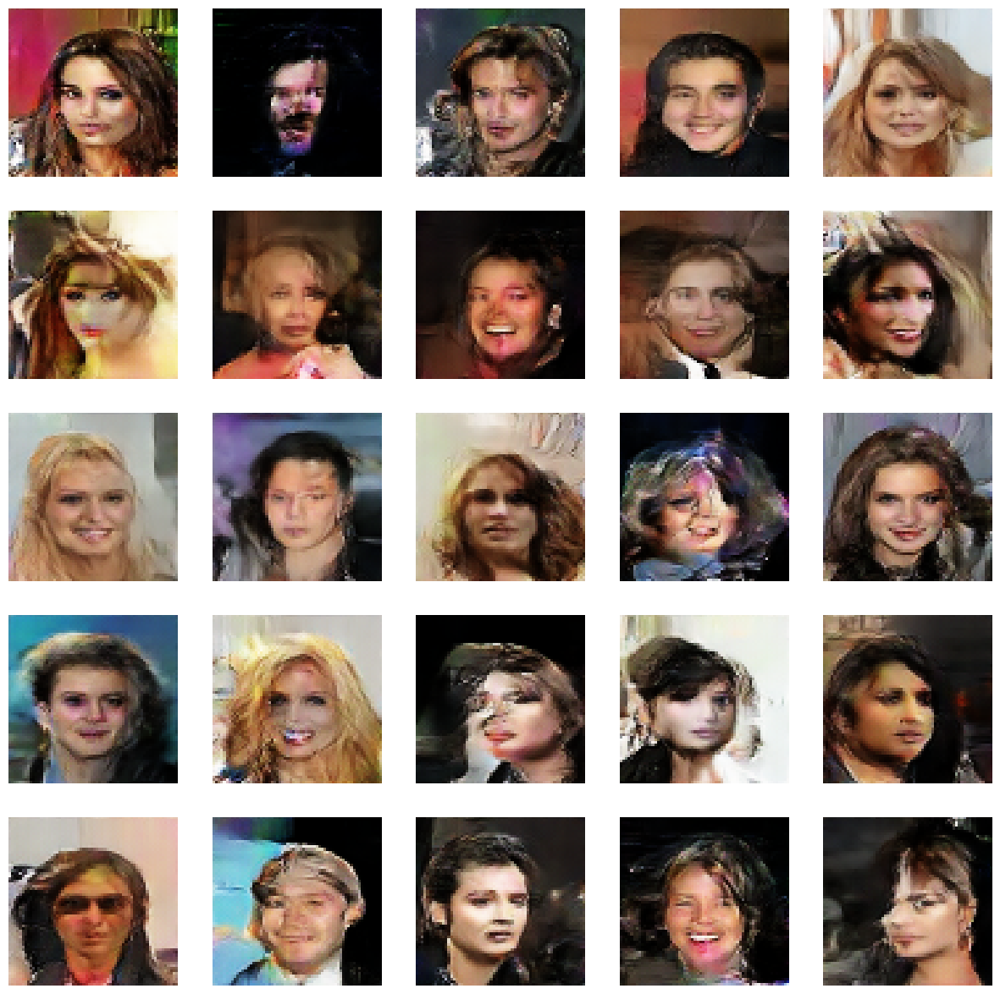

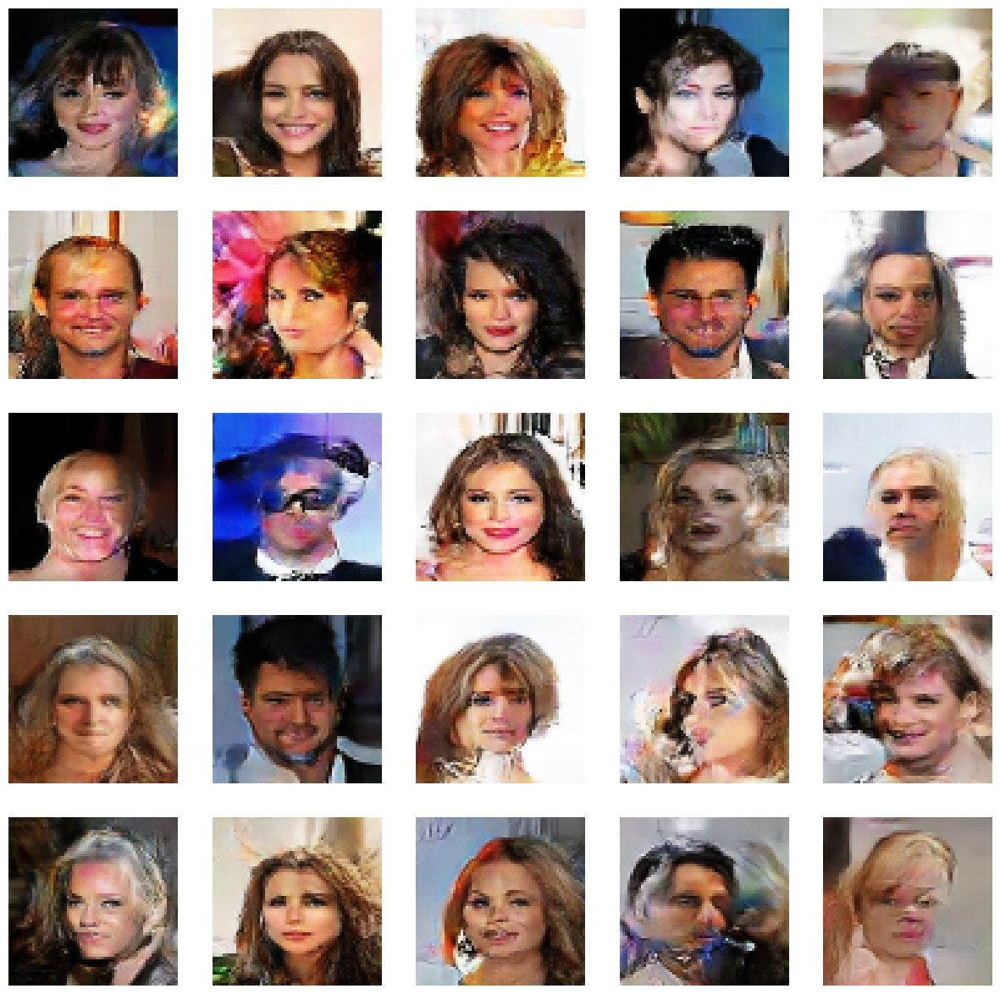

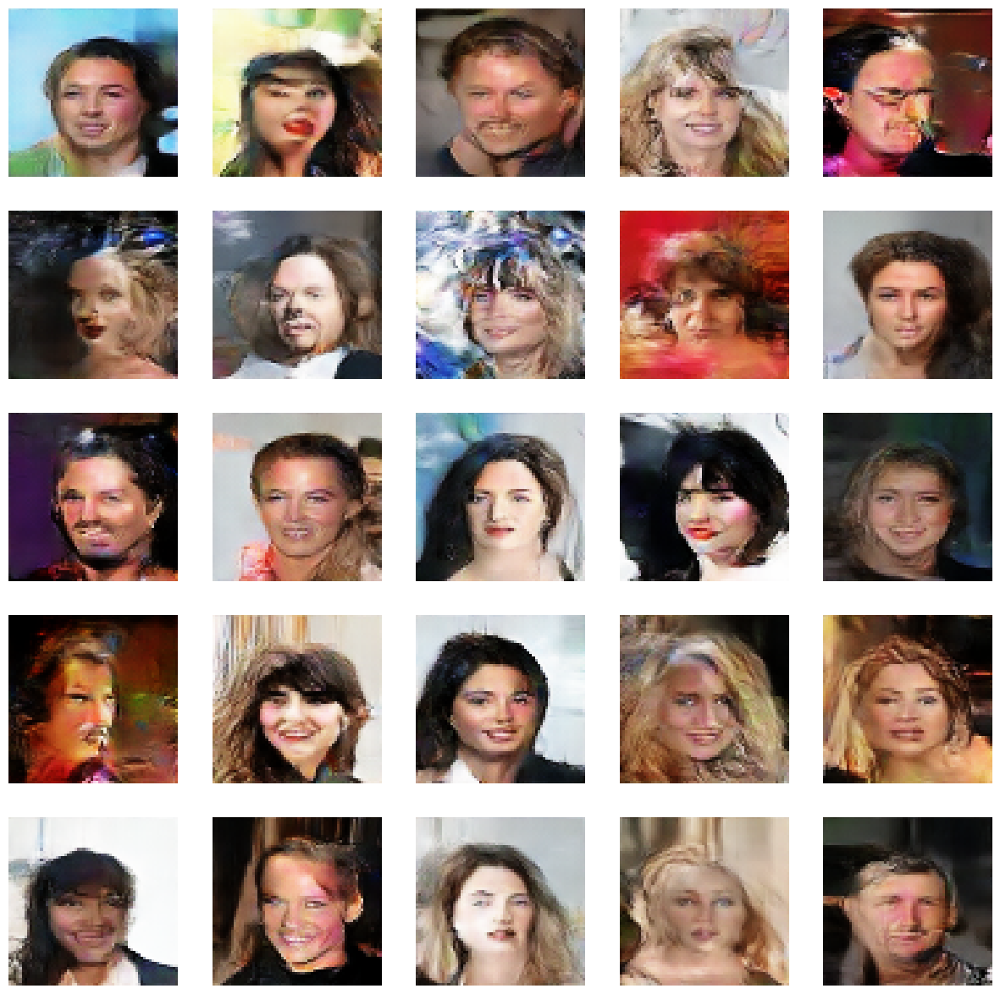

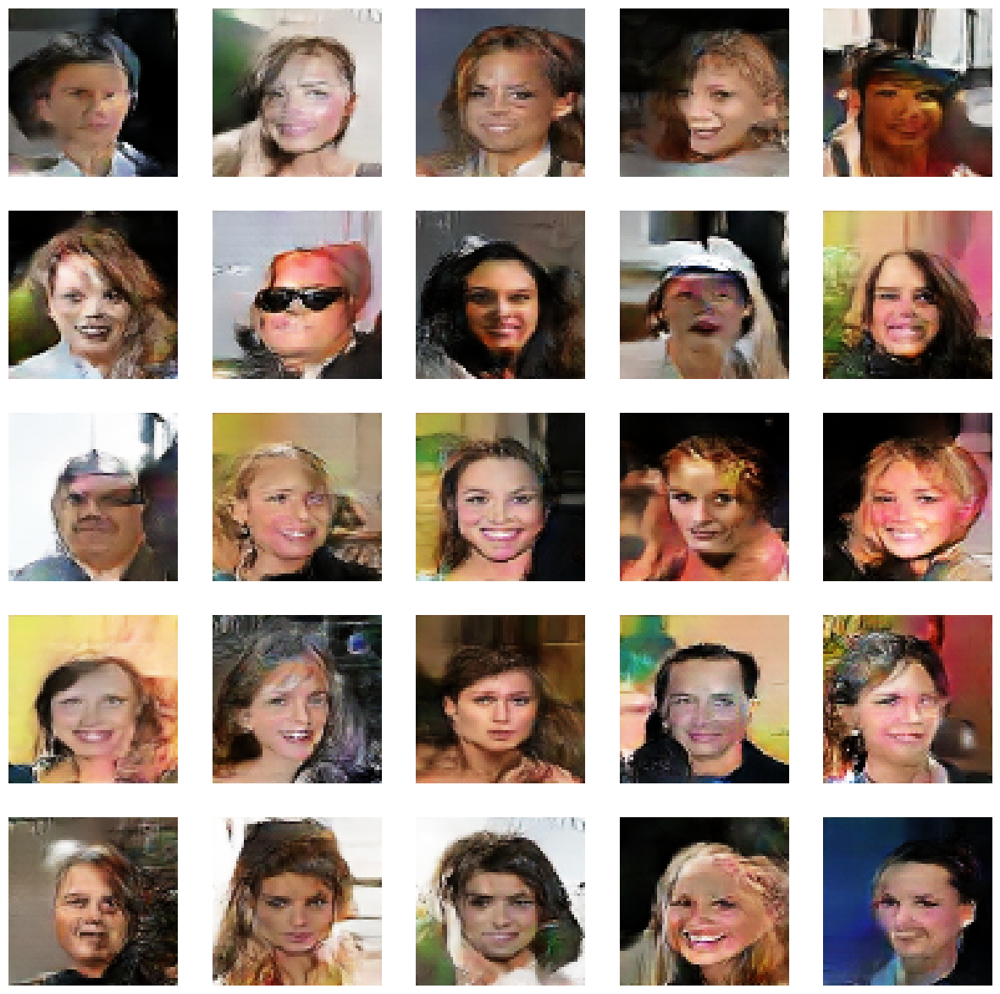

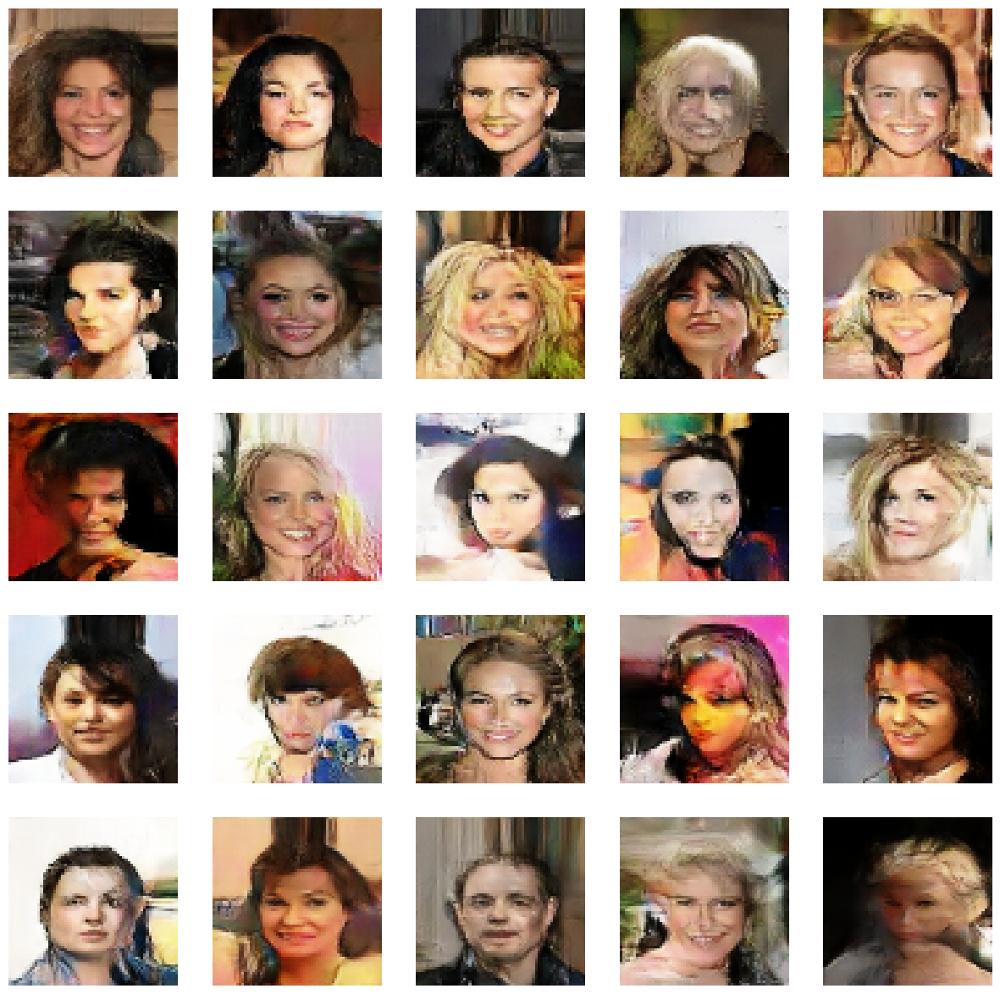

...

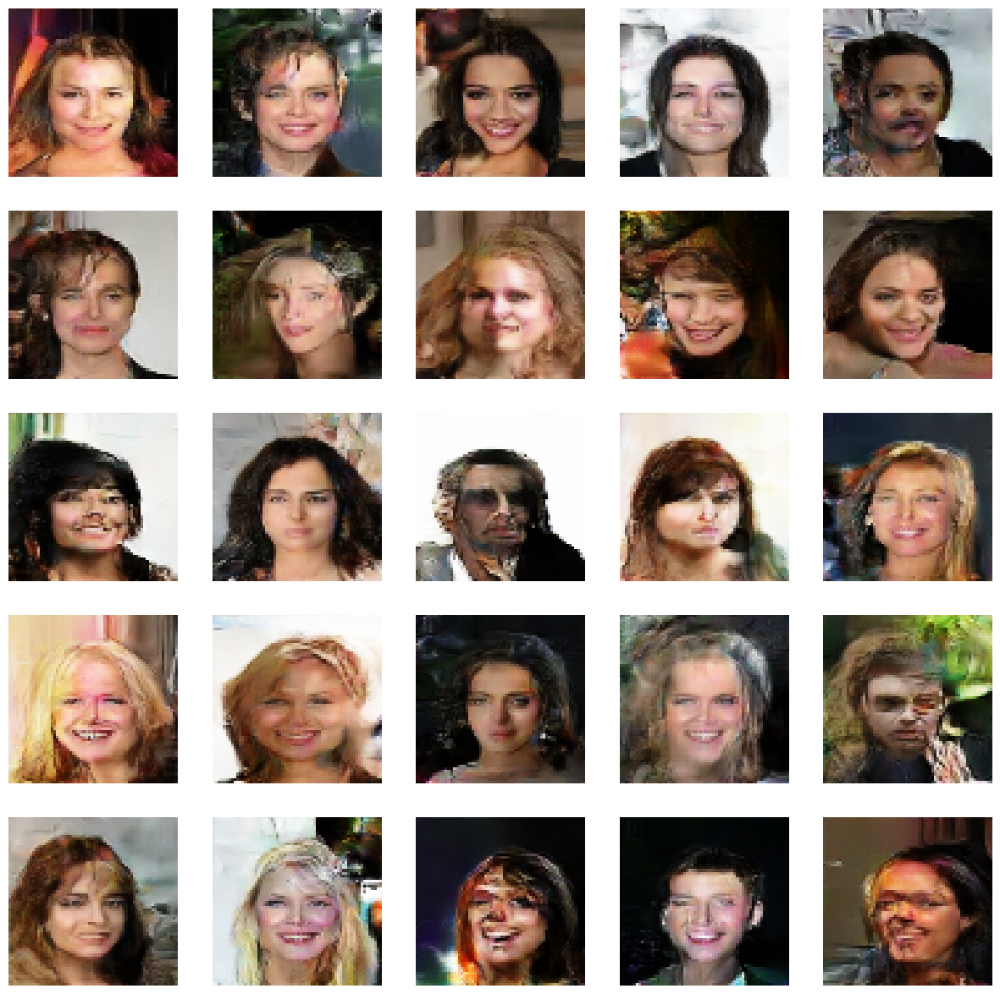

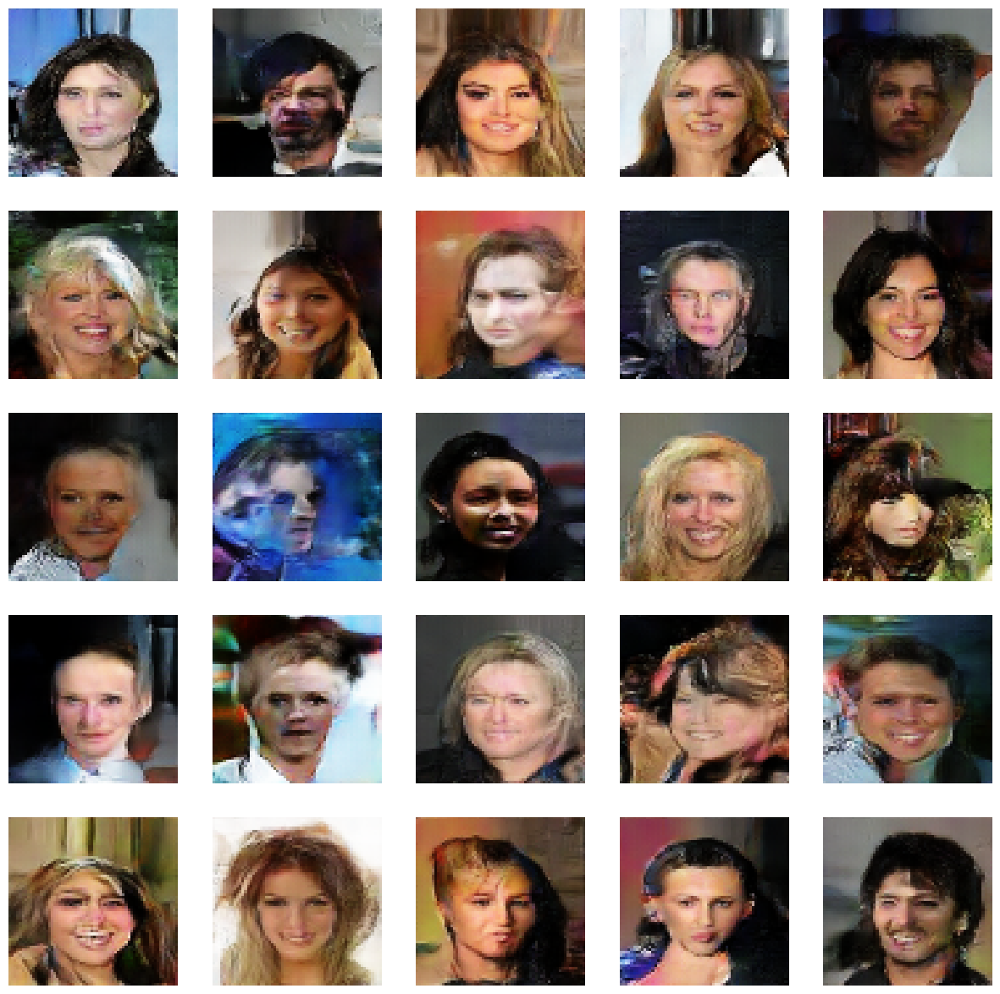

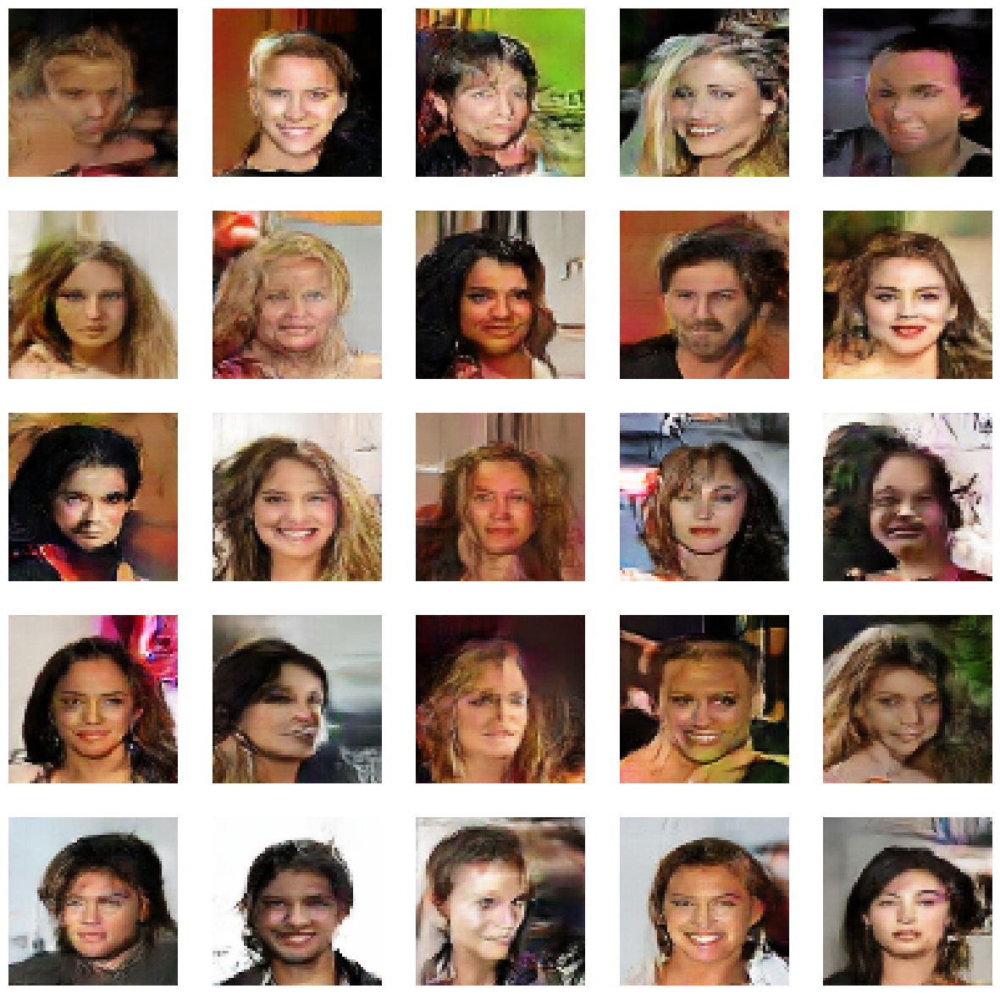

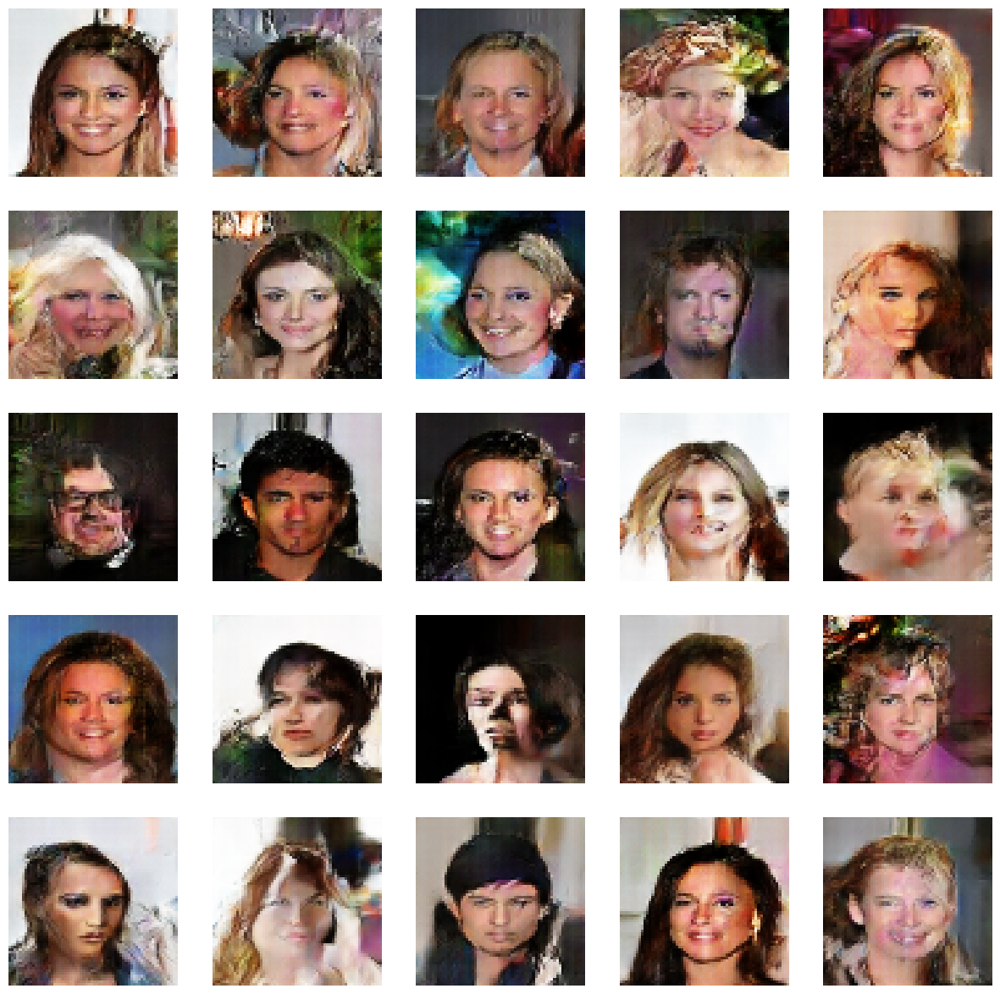

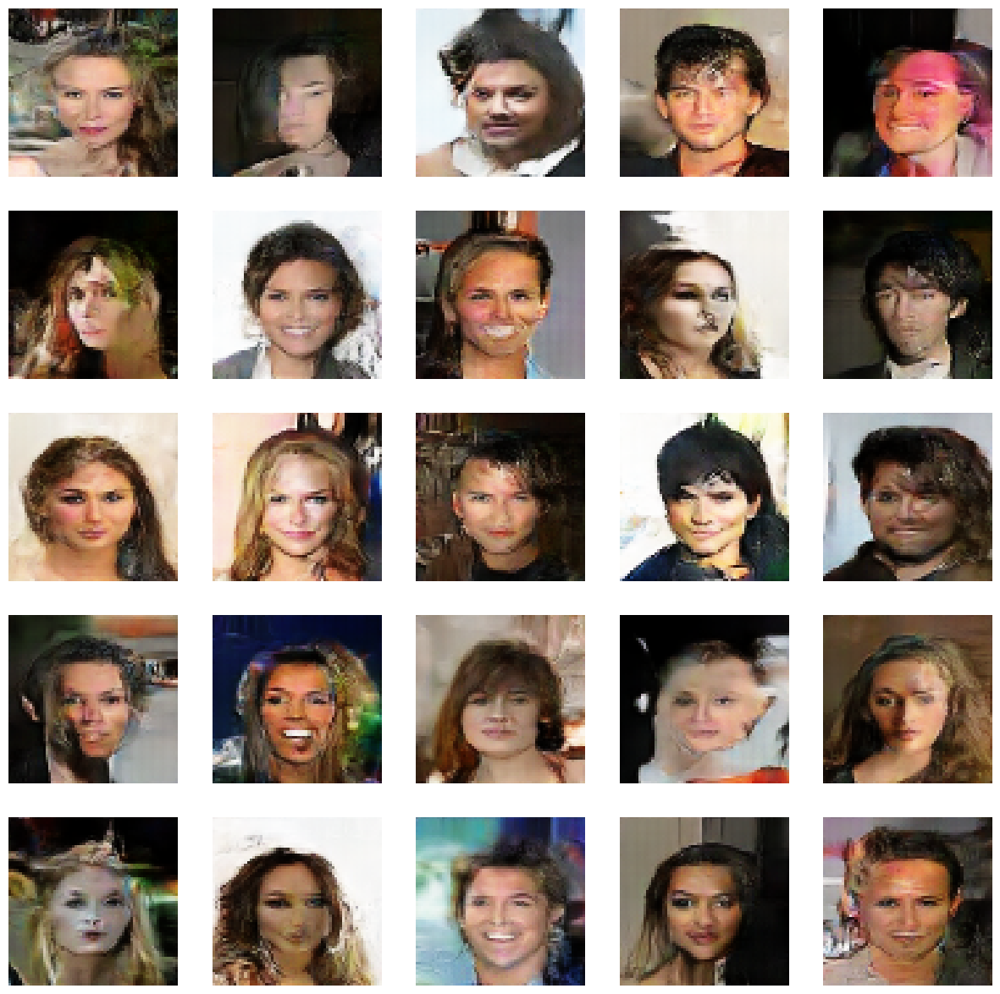

In [21]:
EPOCHS = 25
history = gan.fit(train_dataset, epochs=EPOCHS, callbacks=[ShowImage(LATENT_DIM)])

In [22]:
generator.save_weights("/content/drive/MyDrive/gan/generator_weights.h5")
discriminator.save_weights("/content/drive/MyDrive/gan/discriminator_weights.h5")
gan.save_weights("/content/drive/MyDrive/gan/gan_weights.h5")

Save history (if training)

In [40]:
import pandas as pd

hist_dataframe = pd.DataFrame(history.history)

json = "/content/drive/MyDrive/gan/history.json"
with open(json, mode='w') as f:
    hist_dataframe.to_json(f)

csv = "/content/drive/MyDrive/gan/history.csv"
with open(csv, mode='w') as f:
    hist_dataframe.to_csv(f)

Print history

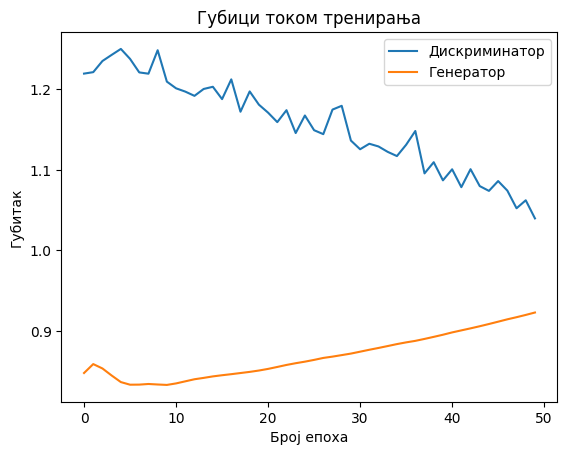

In [54]:
import json

history_file = open("/content/drive/MyDrive/gan/history-plot.json")
loaded_history = json.load(history_file)

plt.plot(loaded_history['d_loss'])
plt.plot(loaded_history['g_loss'])
plt.title('Губици током тренирања')
plt.ylabel('Губитак')
plt.xlabel('Број епоха')
plt.legend(['Дискриминатор', 'Генератор'], loc='upper right')

Generate new images

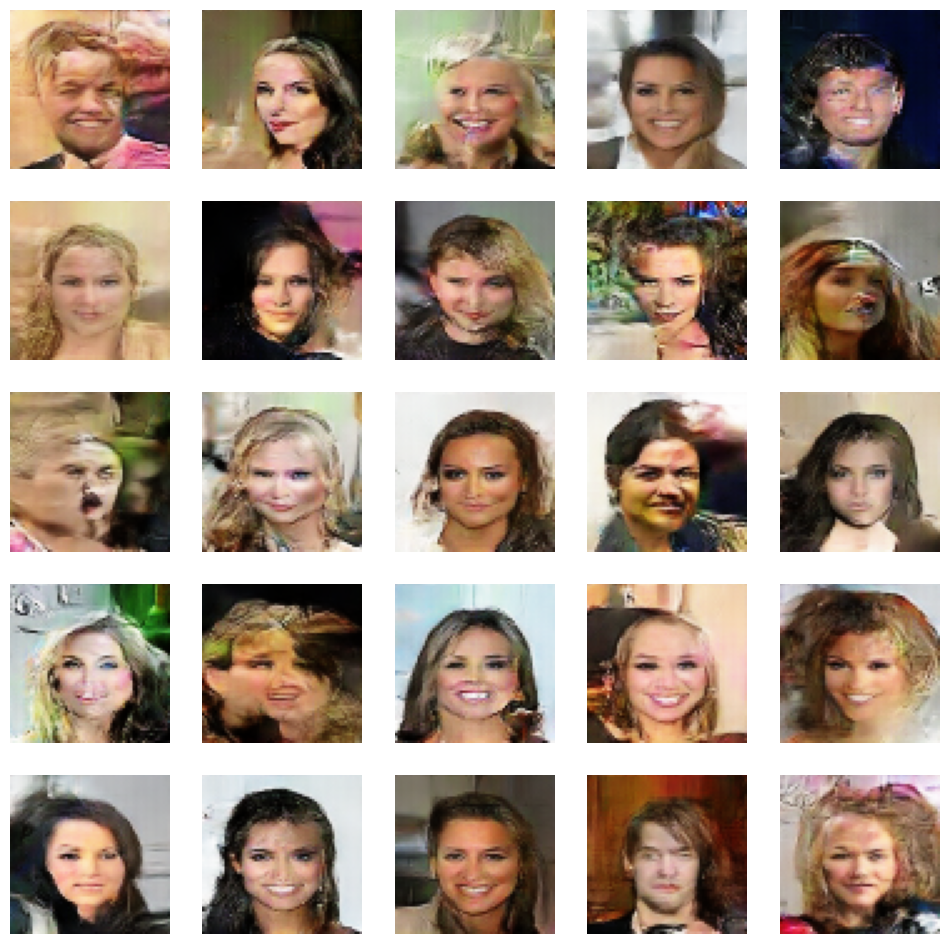

In [10]:
n=5
k=0
generated = generator(tf.random.normal(shape=(25, LATENT_DIM)))
plt.figure(figsize=(12,12))
for i in range(n):
  for j in range(n):
    ax=plt.subplot(n,n,k+1)
    plt.axis('off')
    plt.savefig("Gen5.png")
    plt.imshow((generated[k]+1)/2,)
    k+=1

In [11]:
def generate_images(imgs_num, latent_dim):
  noise = np.random.normal(0, 1, size=(imgs_num, latent_dim))
  generated_imgs = generator.predict(noise)

  for i in range(imgs_num):
    plt.figure()
    plt.imshow((generated_imgs[i]+1)/2,)
    plt.title("Image {}".format(i))
  plt.show()
  return noise, generated_imgs

2/2 [==============================] - 3s 1s/step


<ipython-input-11-03f10f402f48>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


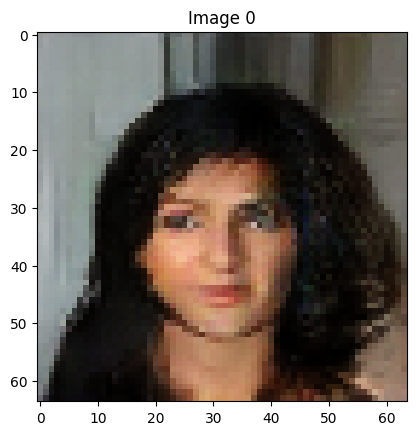

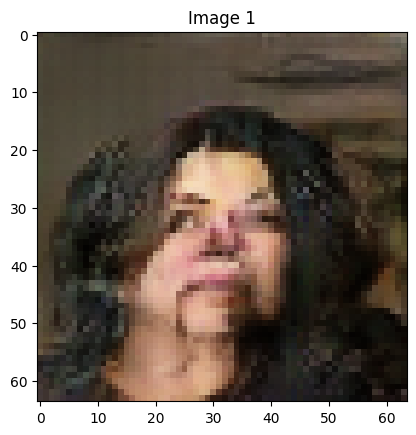

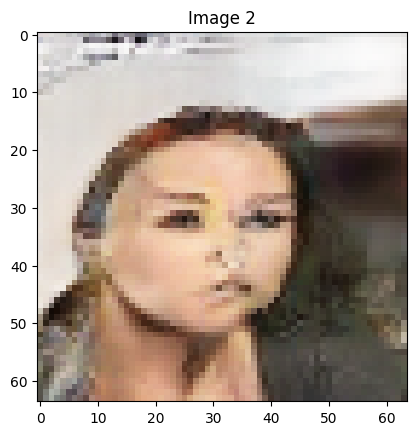

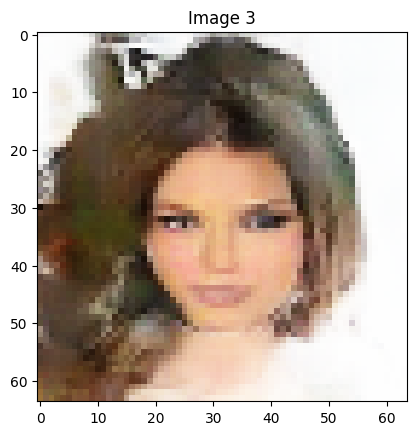

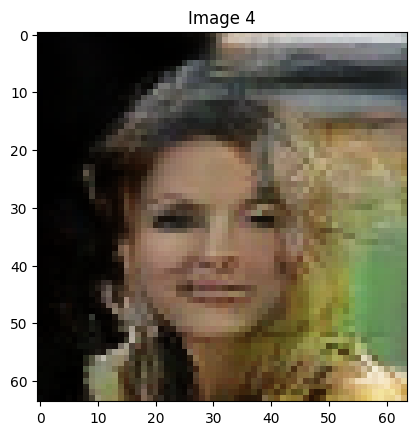

...

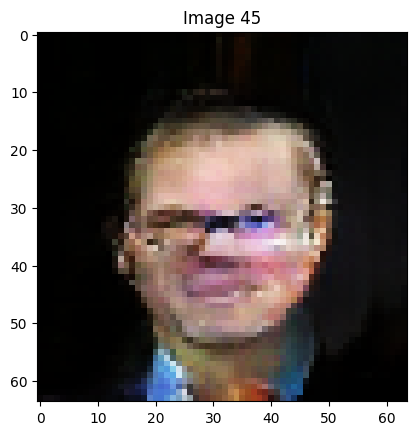

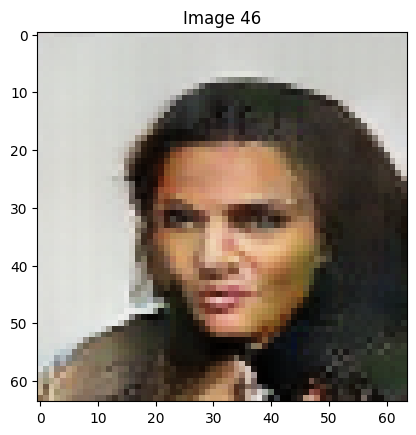

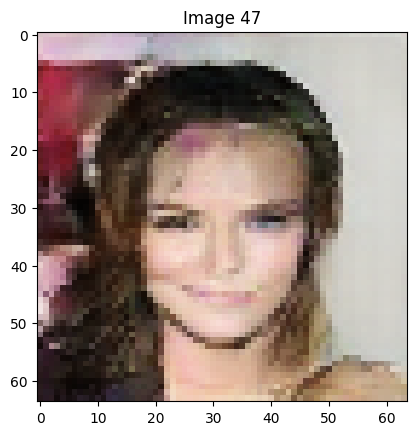

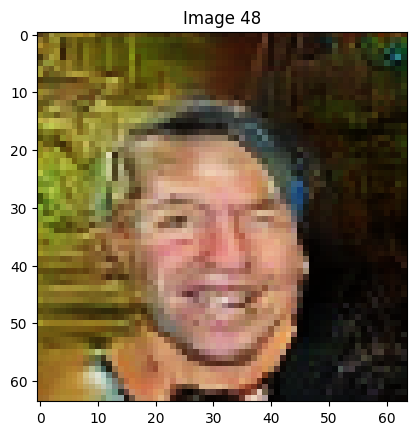

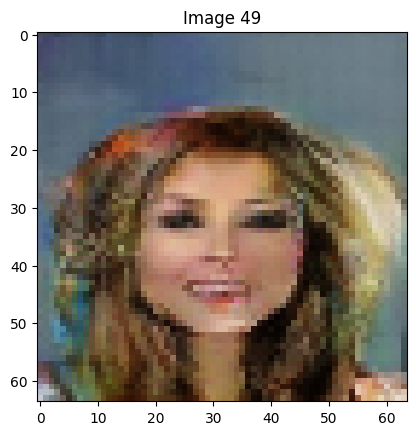

In [12]:
noise, generated_imgs = generate_images(50, 200)

In [13]:
smiling_w = [8, 11, 28]
neutral_w = [0, 3, 17]
nautral_m = [20, 35, 45]

In [14]:
def average_vectors(ind, noise):
  return np.mean(noise[ind, :], axis=0)

In [15]:
sw = average_vectors(smiling_w, noise)
nw = average_vectors(neutral_w, noise)
nm = average_vectors(nautral_m, noise)

In [16]:
sm = sw - nw + nm

1/1 [==============================] - 0s 44ms/step


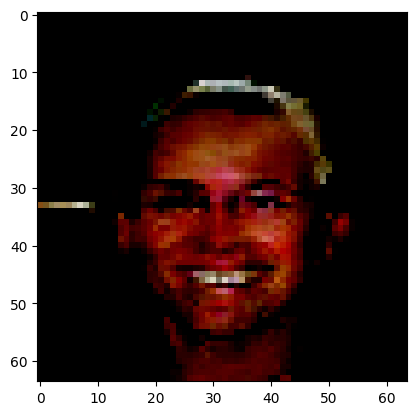

In [17]:
smiling_man_imgs = generator.predict(np.expand_dims(sm, 0))
plt.imshow(np.squeeze(smiling_man_imgs))